Import content image and style image from google drive

In [1]:
!pip install PyDrive

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# 1. Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [2]:
# Get the image file into workplace from drive
downloaded_content = drive.CreateFile({'id':"1kU1eC9jq0PV7A-vStEiFr7Yk3wZR9_o5"})   # replace the id with id of file you want to access
downloaded_content.GetContentFile('trump.jpg')
# how to get the file id see
# https://buomsoo-kim.github.io/colab/2018/04/16/Importing-files-from-Google-Drive-in-Google-Colab.md/

downloaded_style = drive.CreateFile({'id':"1xHupNTfjHq_dH5Z_3n3hVH0rEAFoIRKH"}) 
downloaded_style.GetContentFile('woman.jpg')

downloaded_style = drive.CreateFile({'id':"1WkI-Y1jjH3pcjjFgsH5lGQGsgJO89Cdk"}) 
downloaded_style.GetContentFile('star.jpg')

downloaded_style = drive.CreateFile({'id':"1X0xOiv3wUOAvoPzCFt5AtAvKXZM6_uLJ"}) 
downloaded_style.GetContentFile('horse.jpg')

downloaded_style = drive.CreateFile({'id':"1FbpDzl7ZOfoYtfoF3NOusikn39g-IrVi"}) 
downloaded_style.GetContentFile('nyc.jpg')

downloaded_style = drive.CreateFile({'id':"1OGuxg_kofBAuoaS3UU__mWcwvrAFqLXh"}) 
downloaded_style.GetContentFile('square.jpg')

Import and configure modules

In [3]:
import os
import tensorflow as tf
# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

In [4]:
import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12,12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

In [5]:
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

Visualize and import the image

In [6]:
import tensorflow as tf
from PIL import Image
from keras.applications.vgg19 import VGG19


In [7]:
# functions to show images

# Define a function to load an image and limit ites maximum dimension to 512 pixels

def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

# Create a simple function to display an image
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

height=512
width=512


In [8]:
# preprocess the content image and style image
content_image = load_img('nyc.jpg')
style_image = load_img('star.jpg')

In [9]:
# size of the content image
a,nrows, ncols,b = content_image.shape
content_image.shape

TensorShape([1, 512, 512, 3])

Show the content image and style image

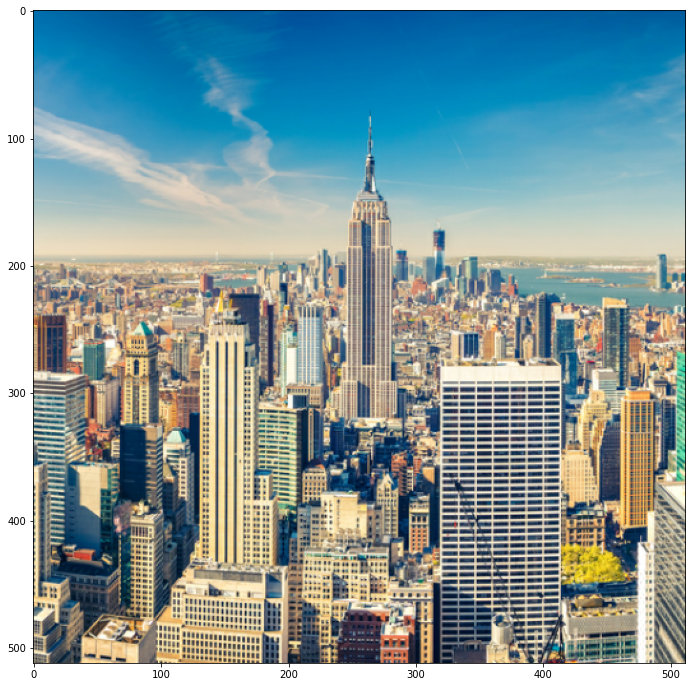

In [10]:
imshow(content_image)

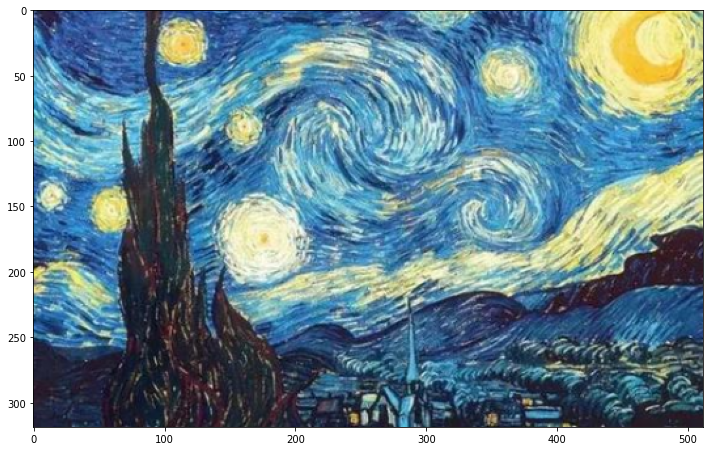

In [11]:
imshow(style_image)

Define content and style representations

In [12]:
# choose intermediate layers from the network to
# represent the style and content of the image:

# VGG 19
# select block5 conv 2 as content layer
content_layers = ['block5_conv2'] 

# select the following layers as style layer
style_layers = ['block1_conv1',
          'block2_conv1',
          'block3_conv1', 
          'block4_conv1', 
          'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

Build the model

In [13]:
def vgg_layers(layer_names):
  """ Creates a vgg model that returns a list of intermediate output values."""
  # Load our model. Load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

Imformation of each layer's output

In [14]:
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

#Look at the statistics of each layer's output
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()

80142336/80134624 [==============================] - 1s 0us/step
block1_conv1
  shape:  (1, 319, 512, 64)
  min:  0.0
  max:  816.5125
  mean:  29.237478

block2_conv1
  shape:  (1, 159, 256, 128)
  min:  0.0
  max:  3333.5537
  mean:  177.26163

block3_conv1
  shape:  (1, 79, 128, 256)
  min:  0.0
  max:  9062.417
  mean:  171.2

block4_conv1
  shape:  (1, 39, 64, 512)
  min:  0.0
  max:  17390.049
  mean:  646.845

block5_conv1
  shape:  (1, 19, 32, 512)
  min:  0.0
  max:  3125.8118
  mean:  52.8843



Calculate the gram matrix

In [15]:
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  return result

Extract style and content
* build a model that returns the style and content tensors.

In [16]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg =  vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers], 
                        outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
              for style_output in style_outputs]

    content_dict = {content_name:value 
              for content_name, value 
              in zip(self.content_layers, content_outputs)}

    style_dict = {style_name:value
            for style_name, value
            in zip(self.style_layers, style_outputs)}

    return {'content':content_dict, 'style':style_dict}

In [17]:
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

print('Styles:')
for name, output in sorted(results['style'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print("Contents:")
for name, output in sorted(results['content'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())

Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  23629.893
    max:  6676698600.0
    mean:  324728060.0

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  16954723000.0
    mean:  2178133800.0

   block3_conv1
    shape:  (1, 256, 256)
    min:  1.8867017
    max:  24253720000.0
    mean:  584133400.0

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  64716087000.0
    mean:  1586615800.0

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  144445090.0
    mean:  2419396.8

Contents:
   block5_conv2
    shape:  (1, 32, 32, 512)
    min:  0.0
    max:  1175.4944
    mean:  16.198986


Initial the image

In [18]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

In [19]:
# create the white noise initial image
init_image = tf.random.uniform([1,nrows, ncols,3])
image = tf.Variable(init_image)

In [20]:
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

Calculate style and content loss

In [21]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    # try different loss function
    
    return loss

In [22]:
def total_variation_loss(image):
  x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
  y_var = image[:, 1:, :, :] - image[:, :-1, :, :]
  
  return tf.reduce_mean(x_var**2)+tf.reduce_mean(y_var**2)
  

Calculate the total loss 

In [23]:
def style_content_loss_modify(image,outputs,alpha = 1,beta = 1, style_weight = 1,content_weight = 0.025,total_variation_weight = 1):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
   
    channels = 3
    a,img_nrows,img_ncols,b= image.shape
    size = img_nrows * img_ncols
    style_loss = tf.add_n([tf.reduce_sum((style_outputs[name]-style_targets[name])**2) 
                             for name in style_outputs.keys()])/(4.0 * (channels ** 2) * (size ** 2))
    style_loss *= style_weight / num_style_layers
    content_loss = tf.add_n([tf.reduce_sum((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])/2
    
    content_loss *= content_weight / num_content_layers
    loss = alpha*style_loss + beta*content_loss
    loss = loss + total_variation_weight * total_variation_loss(image)
    # try different loss function
    
    return loss, content_loss, style_loss

Choosing Adam method as optimaizer

In [24]:
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
#opt = tf.optimizers.Adagrad(learning_rate=0.02)
#opt = tf.optimizers.RMSprop(learning_rate=0.02)
 
style_weight=0.5
content_weight=0.5
total_variation_weight = 1

Get the gradients of the generated image with the loss

In [25]:
# get the gradients of the generated image wrt the loss
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    [loss, content_loss, style_loss] = style_content_loss_modify(image,outputs,1,1,style_weight,content_weight,total_variation_weight)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

  return content_loss, style_loss,loss

Show the first three steps image

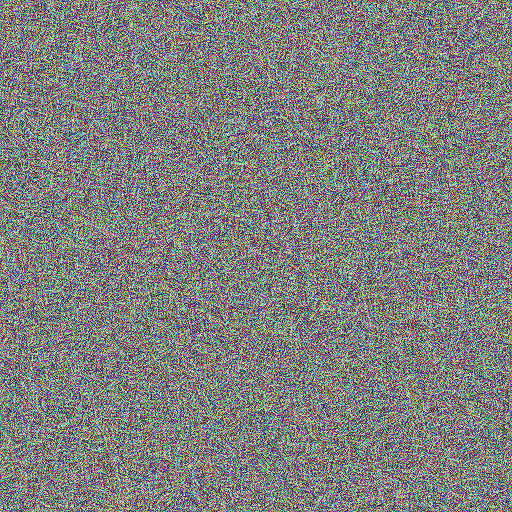

In [26]:
image_list =[]
train_step(image)
train_step(image)
train_step(image)

tensor_to_image(image)

Train the image with 20 epochs.

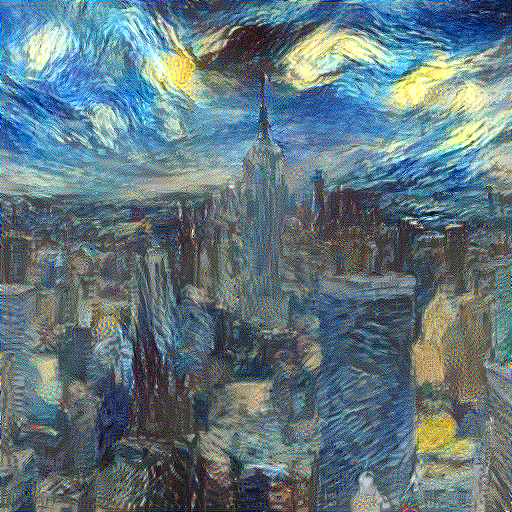

Train step: 10000
Total time: 869.1


In [27]:
import time
start = time.time()
epochs = 20
steps_per_epoch = 500

store_image = tensor_to_image(image)
image_list.append(store_image)

content_loss_list = []
style_loss_list = []
loss_list  = []

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    [one_step_content_loss, one_step_styleloss,one_step_loss] = train_step(image)
    content_loss_list.append(one_step_content_loss.numpy())
    style_loss_list.append(one_step_styleloss.numpy())
    loss_list.append(one_step_loss.numpy())
    print(".", end='')

  store_image = tensor_to_image(image)
  image_list.append(store_image)

  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

Plot the total loss vs. steps

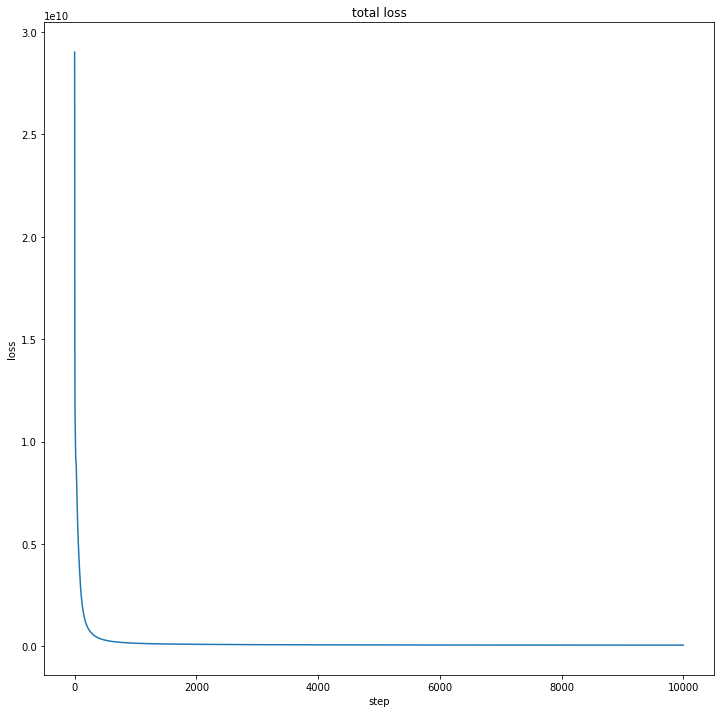

In [28]:
long = len(loss_list)
x = np.linspace(1, long, long)

fig = plt.figure()
plt.plot(x, loss_list, label='line')
plt.xlabel('step')
plt.ylabel('loss')
plt.title('total loss')

plt.show()

Plot the image at each 500 steps

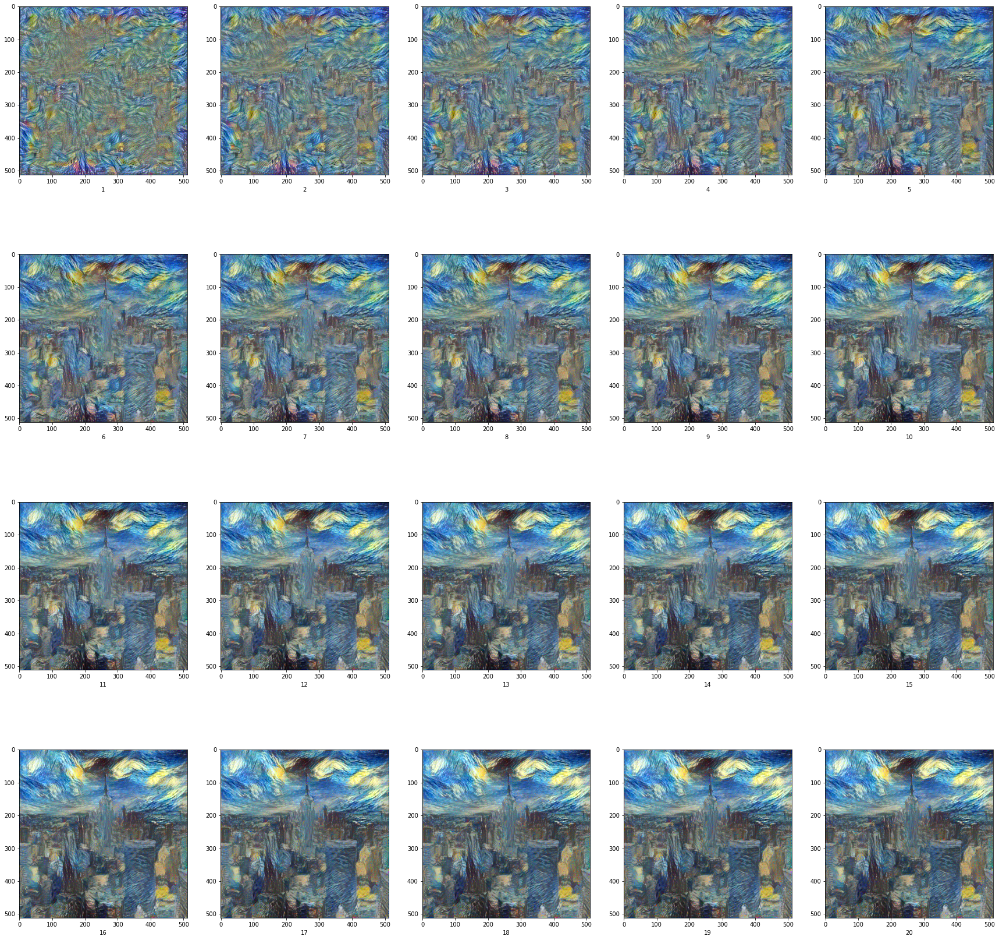

In [29]:
fig=plt.figure(figsize=(30, 30))
columns = 5
rows = 4
for i in range(1, columns*rows +1):    
    fig.add_subplot(rows, columns, i)
    plt.imshow(image_list[i])
    plt.xlabel(i)
plt.show()